In [1]:
import pandas as pd
import numpy as np
from matplotlib.ticker import LogFormatter
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import json
import plategig
import re

PROJECT_PATH = Path('/Users/wak/home2/plategig/projects/Tested_Variants_MIC_Estimations')
PROJECT_ID = ''

#### Step 1: Read Plate Information

In [2]:
# Read the Excel file into a DataFrame
df_plate_info = pd.read_excel(PROJECT_PATH / 'data' / 'PlateInfo_250508_250510_250407.xlsx', engine='openpyxl')
df_plate_info.rename(columns={'Plate': 'Plate_ID'}, inplace=True)
df_plate_info

,Experiment,Plate_ID,Well,Strain,Culture,Replicate,Antibiotic,Dose
0,1,1,A1,Media Only,NaN,NaN,NaN,NaN
1,1,1,A2,Media Only,NaN,NaN,NaN,NaN
2,1,1,A3,Media Only,NaN,NaN,NaN,NaN
3,1,1,A4,Media Only,NaN,NaN,NaN,NaN
4,1,1,A5,Media Only,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
3547,1,37,H8,Media Only,NaN,NaN,NaN,NaN
3548,1,37,H9,Media Only,NaN,NaN,NaN,NaN
3549,1,37,H10,Media Only,NaN,NaN,NaN,NaN
3550,1,37,H11,Media Only,NaN,NaN,NaN,NaN


Collect unique plate IDs

#### Step 2: Read the raw OD data

In [3]:
df = plategig.static.read_OD_data(PROJECT_PATH / "data/ODFinal_250516_250520_250407.xlsx", df_plate_info)
df

,Plate_ID,Well,OD,Row,Column
0,1,A1,0.051,1,1
1,1,A2,0.052,1,2
2,1,A3,0.051,1,3
3,1,A4,0.050,1,4
4,1,A5,0.051,1,5
...,...,...,...,...,...
3547,37,H8,0.045,8,8
3548,37,H9,0.043,8,9
3549,37,H10,0.046,8,10
3550,37,H11,0.044,8,11


Calculate median background of all plates to impute plates with missing media-only wells.

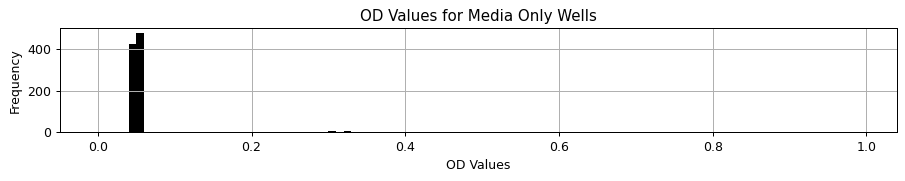

0.05


In [4]:
median_background_all_plates = plategig.static.calc_median_background_all_plates(
    df, df_plate_info, plot=True)
#I had to make these changes because there was a problem with the plate map info, confirm with Adam.
print(median_background_all_plates)

Apply background correction for all plates

In [5]:
df_bc = df.copy()
df_bc['OD_final'] = df_bc['OD'] - median_background_all_plates

#### Evaluate growth metrics

In [6]:
df_bc

,Plate_ID,Well,OD,Row,Column,OD_final
0,1,A1,0.051,1,1,0.001
1,1,A2,0.052,1,2,0.002
2,1,A3,0.051,1,3,0.001
3,1,A4,0.050,1,4,0.000
4,1,A5,0.051,1,5,0.001
...,...,...,...,...,...,...
3547,37,H8,0.045,8,8,-0.005
3548,37,H9,0.043,8,9,-0.007
3549,37,H10,0.046,8,10,-0.004
3550,37,H11,0.044,8,11,-0.006


In [7]:
# Prep the analysis dataframe
df_analysis = pd.merge(df_plate_info, df_bc, on=['Plate_ID', 'Well'])
df_analysis = df_analysis[['Experiment','Strain', 'Culture', 'Replicate', 'Antibiotic',
                           'Dose', 'Plate_ID', 'Well', 'Row', 'Column',
                           'OD', 'OD_final']]
# Remove control wells
df_analysis = df_analysis[~df_analysis['Strain'].isin(['Media Only','Cells Only'])]
# Keep group names
df_analysis['Group'] = df_analysis.Strain
# Define each culture of as a separate strain
# df_analysis['Strain'] = df_analysis.Strain + df_analysis.Culture.astype(int).astype(str)
df_analysis


,Experiment,Strain,Culture,Replicate,Antibiotic,Dose,Plate_ID,Well,Row,Column,OD,OD_final,Group
12,1,NEB10B,1.0,1.0,Ampicillin,30000.000000,1,B1,2,1,0.045,-0.005,NEB10B
13,1,NEB10B,1.0,1.0,Ampicillin,10000.000000,1,B2,2,2,0.044,-0.006,NEB10B
14,1,NEB10B,1.0,1.0,Ampicillin,3333.333330,1,B3,2,3,0.044,-0.006,NEB10B
15,1,NEB10B,1.0,1.0,Ampicillin,1111.111110,1,B4,2,4,0.044,-0.006,NEB10B
16,1,NEB10B,1.0,1.0,Ampicillin,370.370370,1,B5,2,5,0.044,-0.006,NEB10B
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3499,1,TEM-1-CML,1.0,3.0,Ertapenem,0.014632,37,D8,4,8,0.295,0.245,TEM-1-CML
3500,1,TEM-1-CML,1.0,3.0,Ertapenem,0.004877,37,D9,4,9,0.302,0.252,TEM-1-CML
3501,1,TEM-1-CML,1.0,3.0,Ertapenem,0.001626,37,D10,4,10,0.315,0.265,TEM-1-CML
3502,1,TEM-1-CML,1.0,3.0,Ertapenem,0.000542,37,D11,4,11,0.306,0.256,TEM-1-CML


In [8]:
unique_groups = df_analysis['Group'].unique().tolist()
print(unique_groups)

['NEB10B', 'NEB10B_MIC_test_range_changed', 'TEM-1', 'TEM-1_MIC_range_changed', 'TEM-1-CML', 'E104K-R164N-M182T-E240K', 'L21P-E104K-R164N-E240K-T265M', 'Q39K-E104K-R164S-E240K-T265M', 'E104K-R164N-E240K-T265M', 'Q39K-E104K-R164N-E240K', 'Q39K-E104K-R164N-M182T-E240K', 'L21P-E104K-R164N-M182T-E240K', 'NEB10B_MIC_range_changed']


In [9]:
### Double check
unique_columns = df_analysis.columns.tolist()

# Print the list of unique columns
print(unique_columns)

#
unique_values = df_analysis['Strain'].unique()

# Print the unique values
print(unique_values)

['Experiment', 'Strain', 'Culture', 'Replicate', 'Antibiotic', 'Dose', 'Plate_ID', 'Well', 'Row', 'Column', 'OD', 'OD_final', 'Group']
['NEB10B' 'NEB10B_MIC_test_range_changed' 'TEM-1'
 'TEM-1_MIC_range_changed' 'TEM-1-CML' 'E104K-R164N-M182T-E240K'
 'L21P-E104K-R164N-E240K-T265M' 'Q39K-E104K-R164S-E240K-T265M'
 'E104K-R164N-E240K-T265M' 'Q39K-E104K-R164N-E240K'
 'Q39K-E104K-R164N-M182T-E240K' 'L21P-E104K-R164N-M182T-E240K'
 'NEB10B_MIC_range_changed']


In [10]:
antibiotics = df_analysis['Antibiotic'].dropna().unique()
antibiotics

array(['Ampicillin', 'Aztreonam', 'Cefotaxime', 'Ceftriaxone',
       'Ceftazidime', 'Cefepime', 'Imipenem', 'Meropenem', 'Ertapenem'],
      dtype=object)

In [11]:
df_analysis.query("Antibiotic == 'Cefotaxime' & Strain == 'NEB10B'")

,Experiment,Strain,Culture,Replicate,Antibiotic,Dose,Plate_ID,Well,Row,Column,OD,OD_final,Group
972,1,NEB10B,1.0,1.0,Cefotaxime,32.000000,11,B1,2,1,0.049,-0.001,NEB10B
973,1,NEB10B,1.0,1.0,Cefotaxime,10.666667,11,B2,2,2,0.048,-0.002,NEB10B
974,1,NEB10B,1.0,1.0,Cefotaxime,3.555556,11,B3,2,3,0.053,0.003,NEB10B
975,1,NEB10B,1.0,1.0,Cefotaxime,1.185185,11,B4,2,4,0.356,0.306,NEB10B
976,1,NEB10B,1.0,1.0,Cefotaxime,0.395062,11,B5,2,5,0.375,0.325,NEB10B
977,1,NEB10B,1.0,1.0,Cefotaxime,0.131687,11,B6,2,6,0.381,0.331,NEB10B
978,1,NEB10B,1.0,1.0,Cefotaxime,0.043896,11,B7,2,7,0.386,0.336,NEB10B
979,1,NEB10B,1.0,1.0,Cefotaxime,0.014632,11,B8,2,8,0.377,0.327,NEB10B
980,1,NEB10B,1.0,1.0,Cefotaxime,0.004877,11,B9,2,9,0.381,0.331,NEB10B
981,1,NEB10B,1.0,1.0,Cefotaxime,0.001626,11,B10,2,10,0.401,0.351,NEB10B


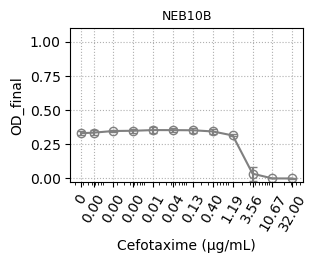

In [12]:

# Adjust the figure size as needed
fig, ax = plt.subplots(figsize=(3, 2))
plategig.static.plot_dose_response_curve_errorbar(df_analysis, 'NEB10B', 'Cefotaxime', strain_colors={'P1':'black'}, ax=ax)

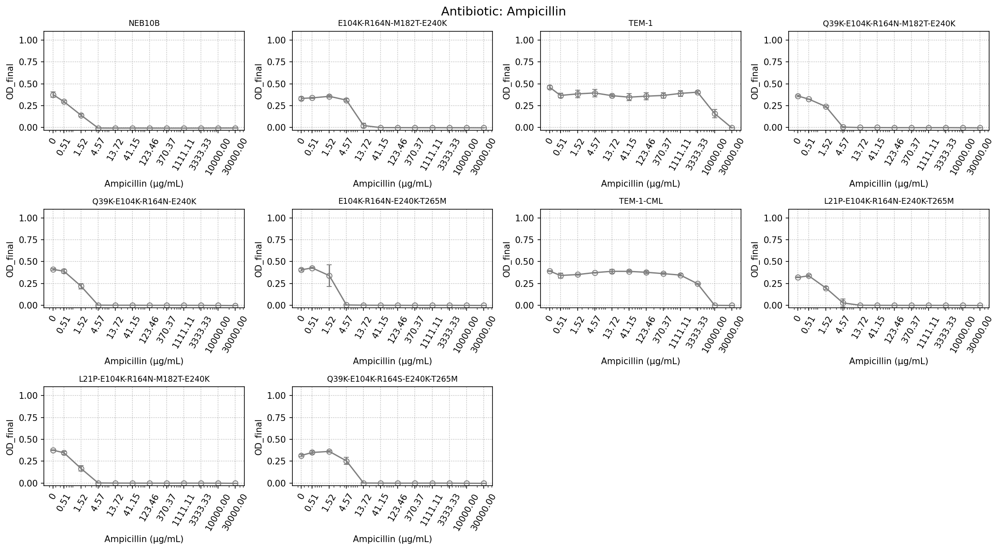

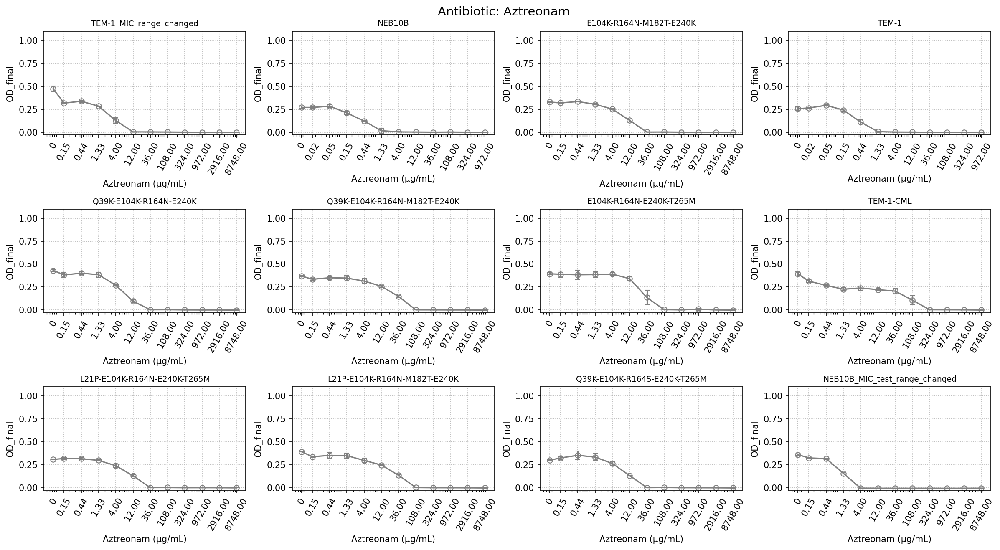

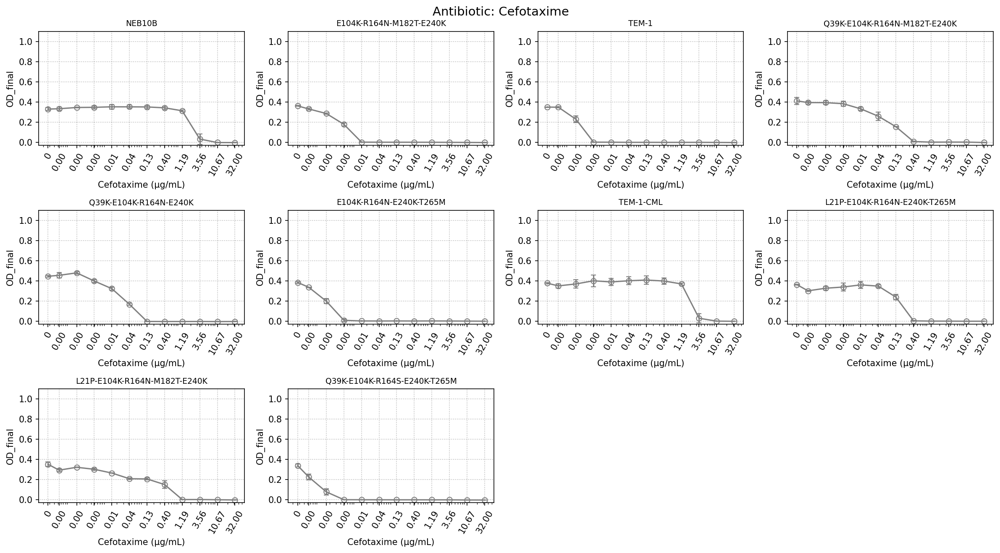

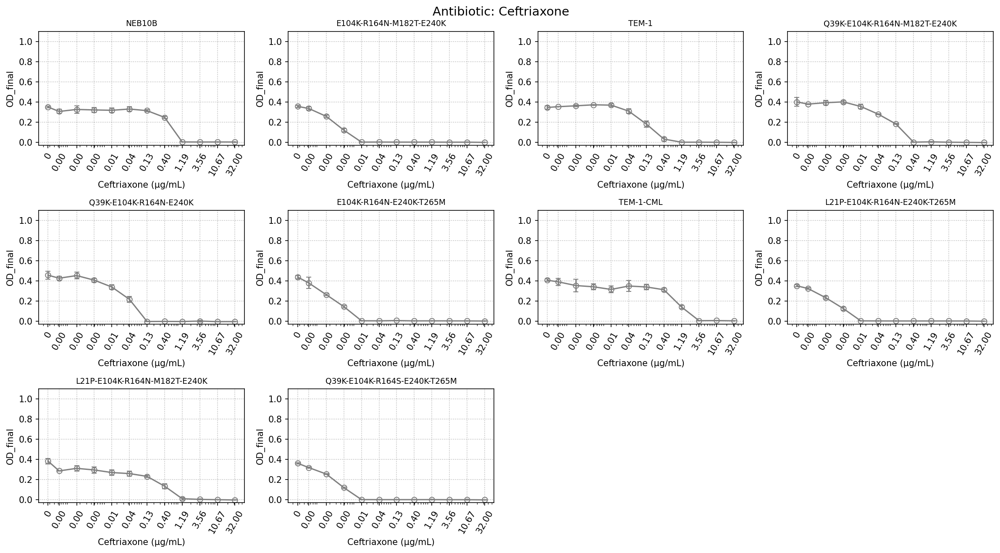

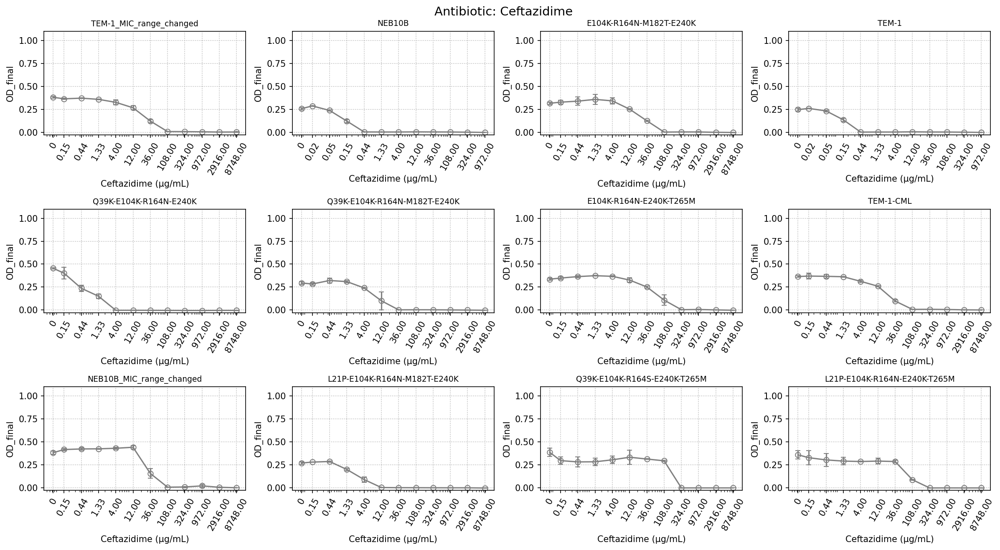

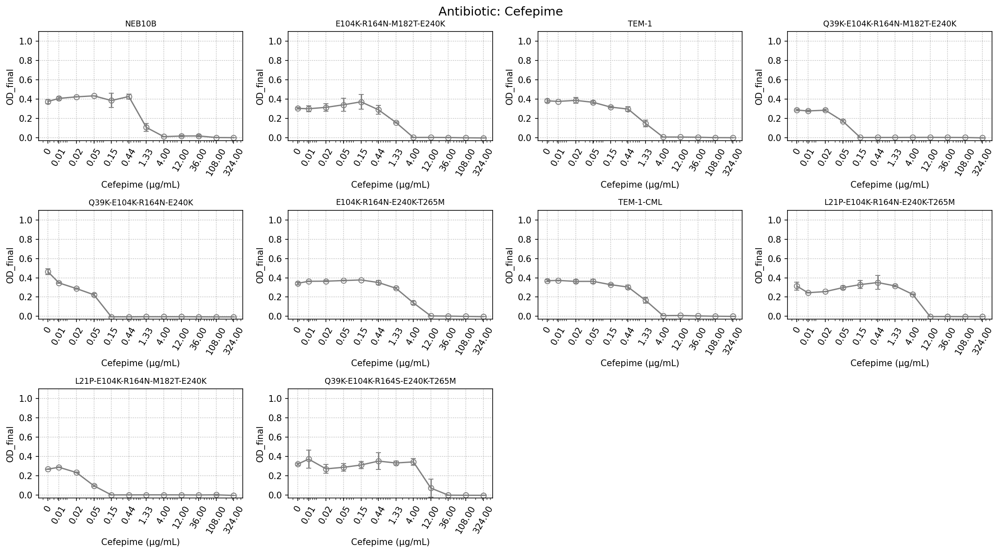

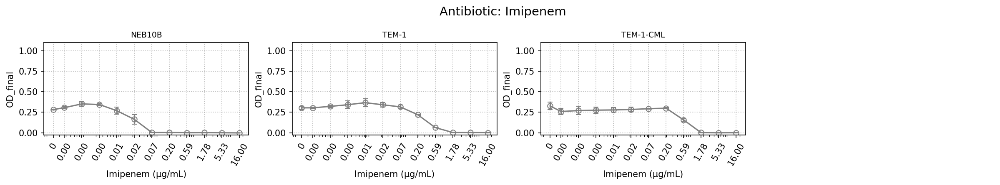

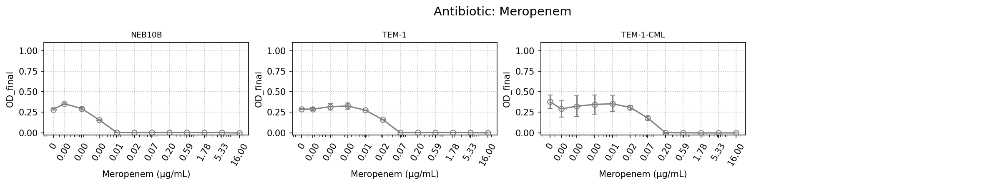

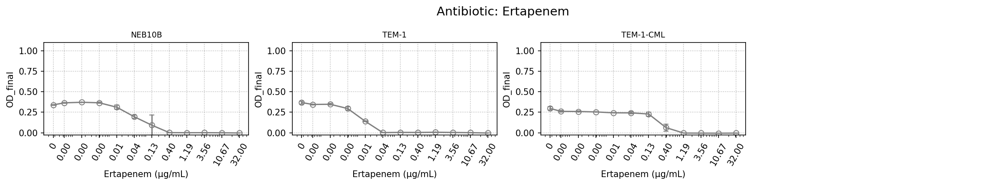

In [13]:
# Plot all dose-response curves in the df_analysis tables (might take too long)
for drug in antibiotics:
    if not pd.isna(drug):
        plategig.static.plot_od_final_for_selected_antibiotic(
            df_analysis,
            plategig.static.plot_dose_response_curve_errorbar,
            drug,
            strain_colors={})

In [14]:
valid_combinations = plategig.static.prep_valid_combinations(df_analysis,
    multiplex=['Strain', 'Antibiotic', 'Replicate'])
valid_combinations

,Strain,Antibiotic,Replicate
0,NEB10B,Ampicillin,1.0
1,NEB10B,Ampicillin,2.0
2,NEB10B,Ampicillin,3.0
3,NEB10B_MIC_test_range_changed,Aztreonam,1.0
4,NEB10B_MIC_test_range_changed,Aztreonam,2.0
...,...,...,...
214,TEM-1,Ertapenem,2.0
215,TEM-1,Ertapenem,3.0
216,TEM-1-CML,Ertapenem,1.0
217,TEM-1-CML,Ertapenem,2.0


In [15]:
growth_features = plategig.static.apply_phenotyper(df_analysis, valid_combinations)
growth_features = plategig.static.cap_growth_features_within_experiment_range(growth_features)
growth_features

Processing combinations:  25%|██▌       | 55/219 [00:16<00:43,  3.80it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  26%|██▌       | 56/219 [00:17<00:47,  3.43it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  26%|██▌       | 57/219 [00:17<00:43,  3.69it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  29%|██▉       | 63/219 [00:17<00:23,  6.69it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  30%|███       | 66/219 [00:18<00:22,  6.67it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  31%|███       | 67/219 [00:20<00:53,  2.84it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  31%|███       | 68/219 [00:20<01:02,  2.40it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  33%|███▎      | 73/219 [00:21<00:35,  4.07it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  37%|███▋      | 81/219 [00:21<00:20,  6.72it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  38%|███▊      | 83/219 [00:22<00:20,  6.48it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  38%|███▊      | 84/219 [00:22<00:23,  5.64it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  40%|████      | 88/219 [00:23<00:23,  5.50it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  41%|████      | 89/219 [00:23<00:26,  4.99it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  42%|████▏     | 91/219 [00:25<00:45,  2.82it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  44%|████▍     | 97/219 [00:25<00:26,  4.66it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  45%|████▍     | 98/219 [00:26<00:27,  4.34it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number 

Processing combinations:  74%|███████▍  | 163/219 [00:40<00:10,  5.30it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  76%|███████▋  | 167/219 [00:40<00:09,  5.42it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  77%|███████▋  | 169/219 [00:41<00:12,  4.15it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  79%|███████▊  | 172/219 [00:42<00:08,  5.54it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  84%|████████▍ | 184/219 [00:45<00:07,  4.95it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  88%|████████▊ | 193/219 [00:47<00:05,  4.62it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  89%|████████▉ | 195/219 [00:47<00:05,  4.22it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations:  90%|████████▉ | 197/219 [00:49<00:09,  2.28it/s]

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


Processing combinations: 100%|██████████| 219/219 [00:51<00:00,  4.27it/s]


,Strain,Antibiotic,Replicate,Status,IC50,MIC,max_growth,hill_coeff,ic50_threshold,mic_threshold,x_fit,y_fit,ransac_used,insufficient_drug
0,NEB10B,Ampicillin,1.0,PASS,0.976577,5.257353,0.423481,1.749176,0.211741,0.021174,"[0.08467543833333332, 0.09701800509843658, 0.1...","[0.4176830310659232, 0.41615181772601, 0.41422...",True,False
1,NEB10B,Ampicillin,2.0,PASS,1.182360,4.666979,0.361396,2.144530,0.180698,0.018070,"[0.08467543833333332, 0.09701800509843658, 0.1...","[0.3601338949590911, 0.35970833124084073, 0.35...",True,False
2,NEB10B,Ampicillin,3.0,PASS,1.069506,4.393320,0.355124,2.083985,0.177562,0.017756,"[0.08467543833333332, 0.09701800509843658, 0.1...","[0.3533343983223476, 0.3527514764097245, 0.351...",True,False
3,NEB10B_MIC_test_range_changed,Aztreonam,1.0,PASS,1.237952,3.278854,0.339554,3.022927,0.169777,0.016978,"[0.02469135802469136, 0.028290450521131365, 0....","[0.3395519065498059, 0.33955065336329604, 0.33...",True,False
4,NEB10B_MIC_test_range_changed,Aztreonam,2.0,PASS,1.221201,3.462827,0.337995,2.825077,0.168997,0.016900,"[0.02469135802469136, 0.028290450521131365, 0....","[0.33798922955431837, 0.33798663854408095, 0.3...",True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,TEM-1,Ertapenem,2.0,PASS,0.011361,0.048568,0.364478,2.026713,0.182239,0.018224,"[9.032046831162824e-05, 0.00010348587296252898...","[0.36445744454710793, 0.36445101605448255, 0.3...",True,False
215,TEM-1,Ertapenem,3.0,PASS,0.010561,0.054027,0.349330,1.803814,0.174665,0.017467,"[9.032046831162824e-05, 0.00010348587296252898...","[0.34926507344307384, 0.3492469903472172, 0.34...",True,False
216,TEM-1-CML,Ertapenem,1.0,PASS,0.391326,0.430469,0.252834,30.885344,0.126417,0.012642,"[9.032046831162824e-05, 0.00010348587296252898...","[0.2528338847551802, 0.2528338847551802, 0.252...",True,False
217,TEM-1-CML,Ertapenem,2.0,PASS,0.239919,0.751954,0.256678,2.577472,0.128339,0.012834,"[9.032046831162824e-05, 0.00010348587296252898...","[0.256678388353537, 0.2566783881925657, 0.2566...",True,False


In [16]:
growth_features.query('Strain == "TEM-1-CML"')

,Strain,Antibiotic,Replicate,Status,IC50,MIC,max_growth,hill_coeff,ic50_threshold,mic_threshold,x_fit,y_fit,ransac_used,insufficient_drug
12,TEM-1-CML,Ampicillin,1.0,PASS,3434.321137,3973.155341,0.366562,20.203189,0.183281,0.018328,"[0.08467543833333332, 0.09701800509843658, 0.1...","[0.3665616321911333, 0.3665616321911333, 0.366...",True,False
13,TEM-1-CML,Ampicillin,2.0,PASS,3437.687744,3846.091496,0.367131,26.229129,0.183565,0.018357,"[0.08467543833333332, 0.09701800509843658, 0.1...","[0.3671305295470259, 0.3671305295470259, 0.367...",True,False
14,TEM-1-CML,Ampicillin,3.0,PASS,3823.495574,6616.036246,0.367957,5.369817,0.183978,0.018398,"[0.08467543833333332, 0.09701800509843658, 0.1...","[0.36795655126229093, 0.36795655126229093, 0.3...",True,False
15,TEM-1-CML,Aztreonam,1.0,PASS,43.786233,540.673483,0.281385,1.171452,0.140692,0.014069,"[0.02469135802469136, 0.028290450521131365, 0....","[0.2813407921409694, 0.28133319040365423, 0.28...",True,False
16,TEM-1-CML,Aztreonam,2.0,PASS,110.345334,237.045454,0.238042,3.850767,0.119021,0.011902,"[0.02469135802469136, 0.028290450521131365, 0....","[0.2380422105260849, 0.23804221052608346, 0.23...",True,False
17,TEM-1-CML,Aztreonam,3.0,PASS,73.324442,192.450888,0.229903,3.051400,0.114952,0.011495,"[0.02469135802469136, 0.028290450521131365, 0....","[0.22990342649483408, 0.22990342649183848, 0.2...",True,False
72,TEM-1-CML,Cefotaxime,1.0,PASS,3.396151,3.787541,0.351556,26.994797,0.175778,0.017578,"[9.032000012701254e-05, 0.00010348534195226199...","[0.35155641973744894, 0.35155641973744894, 0.3...",True,False
73,TEM-1-CML,Cefotaxime,2.0,PASS,1.817749,2.723509,0.396879,7.282404,0.198439,0.019844,"[9.032000012701254e-05, 0.00010348534195226199...","[0.3968785313052588, 0.3968785313052588, 0.396...",True,False
74,TEM-1-CML,Cefotaxime,3.0,PASS,1.571319,2.319254,0.409378,7.562830,0.204689,0.020469,"[9.032000012701254e-05, 0.00010348534195226199...","[0.40937842902337096, 0.40937842902337096, 0.4...",True,False
75,TEM-1-CML,Ceftriaxone,1.0,PASS,0.800548,3.649014,0.374953,1.941069,0.187477,0.018748,"[9.032000012701254e-05, 0.00010348534195226199...","[0.3749533553060642, 0.37495335284099574, 0.37...",True,False


In [17]:
# growth_features['group'] = growth_features['Strain'].apply(lambda x: re.split(r'[1-9]', x)[0])
# growth_features

In [18]:
strains = list(set(df_analysis['Strain'].str.lower()) - set(['media only', 'cells only', np.nan]))
print(strains)

['e104k-r164n-m182t-e240k', 'neb10b', 'e104k-r164n-e240k-t265m', 'neb10b_mic_test_range_changed', 'q39k-e104k-r164s-e240k-t265m', 'q39k-e104k-r164n-e240k', 'tem-1-cml', 'l21p-e104k-r164n-e240k-t265m', 'l21p-e104k-r164n-m182t-e240k', 'tem-1_mic_range_changed', 'q39k-e104k-r164n-m182t-e240k', 'neb10b_mic_range_changed', 'tem-1']


In [19]:
antibiotics = list(set(df_analysis['Antibiotic'].str.lower()) - set(['media only', 'cells only', np.nan]))
antibiotics

['ceftazidime',
 'ertapenem',
 'meropenem',
 'imipenem',
 'cefepime',
 'cefotaxime',
 'aztreonam',
 'ceftriaxone',
 'ampicillin']

In [20]:
strain_colors = {strain:color for strain, color in zip(strains, sns.color_palette('muted')[:len(strains)])}


In [21]:
num_drugs = growth_features['Antibiotic'].nunique()
num_experiments = growth_features.shape[0]
num_cols = 6
num_rows = num_experiments//num_cols + (num_experiments % num_cols > 0)
fig, axes = plt.subplots(num_rows, num_cols,
                       figsize=(num_cols*3, num_rows*2), dpi=300)

for ix, row in growth_features.iterrows():
    plategig.static.plot_dose_response_curve_fit(df_analysis,
                                                growth_features=growth_features,
                                                strain_colors=strain_colors,
                                                strain=row['Strain'],
                                                antibiotic=row['Antibiotic'],
                                                replicate=row['Replicate'],
                                                ax=axes.flat[ix])
    
    if row['Status'] == 'FAIL':
        axes.flat[ix].text(0.5, 0.5, f'FAIL', color='red', fontsize=12, fontweight='bold',
                        ha='center', va='center', transform=axes.flat[ix].transAxes)
        # gray out the entire axes
        axes.flat[ix].set_facecolor('lightgray')
    if ix % num_cols != 0:
        axes.flat[ix].set_yticklabels([])
        axes.flat[ix].set_ylabel('')
# Hide the rest of the axes
for ix in range(num_experiments, num_cols*num_rows):
    axes.flat[ix].axis('off')
    
fig.tight_layout()
# set empty space between subplots
fig.subplots_adjust(wspace=0.05)
fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures' / f'CML IC50 fits.png', dpi=300, bbox_inches='tight')

In [22]:
def plot_ic50_mic_with_sem(growth_features):
    """Plot IC50 and MIC values with mean and standard error of the mean across replicates"""
    summary_stats = (growth_features[growth_features['Status'] == 'PASS']
                    .groupby(['Strain', 'Antibiotic'])
                    .agg({
                        'IC50': ['median', 'min', 'max', 'count'],
                        'MIC': ['median', 'min', 'max', 'count'],
                        'insufficient_drug': 'any'
                    })
                    .reset_index())
    
    summary_stats.columns = ['_'.join(col).strip('_') if col[1] else col[0] for col in summary_stats.columns.values]

    return summary_stats

def create_ic50_plot_with_sem(growth_features):
    summary_stats = plot_ic50_mic_with_sem(growth_features)
    final_chart = alt.vconcat()
    
    # Determine color scheme based on number of strains
    num_strains = summary_stats['Strain'].nunique()
    color_scheme = "category20" if num_strains > 10 else "category10"
    
    for drug in sorted(summary_stats['Antibiotic'].unique()):
        filtered_data = summary_stats.query(f'Antibiotic == "{drug}"').copy()
        if filtered_data.empty: continue
        
        filtered_data = filtered_data.copy()
        filtered_data['StrainGroup'] = filtered_data['Strain']
        base = alt.Chart(filtered_data).encode(
            x=alt.X('Strain', axis=alt.Axis(labelAngle=-45, labelLimit=0))
        ).properties(width=700, height=300)
        
        ic50 = base.encode(
            y=alt.Y('IC50_median:Q', scale=alt.Scale(type="log")),
            color=alt.Color("StrainGroup:N", scale=alt.Scale(scheme=color_scheme))
        ).mark_point(filled=True, size=200)
        
        error_bars = base.mark_errorbar(ticks=True, size=10, thickness=2).encode(
            alt.Y("IC50_min:Q", scale=alt.Scale(type="log")).title('IC50'),
            alt.Y2("IC50_max:Q"),
            color=alt.Color('StrainGroup', scale=alt.Scale(scheme=color_scheme))
        )
        
        dagger = base.mark_text(fontSize=20, dx=10, dy=-10).encode(
            y=alt.Y('IC50_median'),
            text=alt.condition(alt.datum.insufficient_drug, alt.value("‡"), alt.value(""))
        )
        
        final_chart = alt.vconcat(final_chart, alt.layer(ic50, error_bars, dagger).properties(title=f'{drug} - IC50 (Median ± Range)'))
    
    return final_chart

def create_mic_plot_with_sem(growth_features):
    summary_stats = plot_ic50_mic_with_sem(growth_features)
    final_chart = alt.vconcat()
    
    # Determine color scheme based on number of strains
    num_strains = summary_stats['Strain'].nunique()
    color_scheme = "category20" if num_strains > 10 else "category10"
    
    for drug in sorted(summary_stats['Antibiotic'].unique()):
        filtered_data = summary_stats.query(f'Antibiotic == "{drug}"').copy()
        if filtered_data.empty: continue
        
        filtered_data = filtered_data.copy()
        filtered_data['StrainGroup'] = filtered_data['Strain']
        base = alt.Chart(filtered_data).encode(
            x=alt.X('Strain', axis=alt.Axis(labelAngle=-45, labelLimit=0))
        ).properties(width=700, height=300)
        
        mic = base.encode(
            y=alt.Y('MIC_median:Q', scale=alt.Scale(type="log")),
            color=alt.Color("StrainGroup:N", scale=alt.Scale(scheme=color_scheme))
        ).mark_point(filled=True, size=200)
        
        error_bars = base.mark_errorbar(ticks=True, size=10, thickness=2).encode(
            alt.Y("MIC_min:Q", scale=alt.Scale(type="log")).title('MIC'),
            alt.Y2("MIC_max:Q"),
            color=alt.Color('StrainGroup', scale=alt.Scale(scheme=color_scheme))
        )
        
        dagger = base.mark_text(fontSize=20, dx=10, dy=-10).encode(
            y=alt.Y('MIC_median'),
            text=alt.condition(alt.datum.insufficient_drug, alt.value("‡"), alt.value(""))
        )
        
        final_chart = alt.vconcat(final_chart, alt.layer(mic, error_bars, dagger).properties(title=f'{drug} - MIC (Median ± Range)'))
    
    return final_chart


In [38]:
def create_combined_ic50_plot(growth_features):
    """Create a combined IC50 plot with all drugs on the same chart, x-axis as strains"""
    summary_stats = plot_ic50_mic_with_sem(growth_features)
    
    # Determine color scheme based on number of drugs
    num_drugs = summary_stats['Antibiotic'].nunique()
    color_scheme = "category20" if num_drugs > 10 else "category10"
    
    base = alt.Chart(summary_stats).add_selection(
        alt.selection_interval(bind='scales', encodings=['x'])
    ).properties(width=800, height=400)
    
    points = base.mark_point(filled=True, size=100).encode(
        x=alt.X('Strain:O', axis=alt.Axis(labelAngle=-45, labelLimit=0)),
        y=alt.Y('IC50_median:Q', scale=alt.Scale(type="log"), title='IC50 (μg/mL)'),
        color=alt.Color('Antibiotic:N', scale=alt.Scale(scheme=color_scheme), 
                       legend=alt.Legend(title="Antibiotic"))
    )
    
    error_bars = base.mark_errorbar(ticks=True, size=5, thickness=1).encode(
        x=alt.X('Strain:O'),
        y=alt.Y('IC50_min:Q', scale=alt.Scale(type="log"), title='IC50 (μg/mL)'),
        y2=alt.Y2('IC50_max:Q'),
        color=alt.Color('Antibiotic:N', scale=alt.Scale(scheme=color_scheme), legend=None)
    )
    
    dagger = base.mark_text(fontSize=12, dx=5, dy=-5).encode(
        x=alt.X('Strain:O'),
        y=alt.Y('IC50_median:Q'),
        color=alt.Color('Antibiotic:N', scale=alt.Scale(scheme=color_scheme), legend=None),
        text=alt.condition(alt.datum.insufficient_drug, alt.value("‡"), alt.value(""))
    )
    
    return alt.layer(points, error_bars, dagger).properties(
        title='IC50 Values by Strain and Antibiotic (Median ± Range)'
    )

def create_combined_mic_plot(growth_features):
    """Create a combined MIC plot with all drugs on the same chart, x-axis as strains"""
    summary_stats = plot_ic50_mic_with_sem(growth_features)
    
    # Determine color scheme based on number of drugs
    num_drugs = summary_stats['Antibiotic'].nunique()
    color_scheme = "category20" if num_drugs > 10 else "category10"
    
    base = alt.Chart(summary_stats).add_selection(
        alt.selection_interval(bind='scales', encodings=['x'])
    ).properties(width=800, height=400)
    
    points = base.mark_point(filled=True, size=100).encode(
        x=alt.X('Strain:O', axis=alt.Axis(labelAngle=-45, labelLimit=0)),
        y=alt.Y('MIC_median:Q', scale=alt.Scale(type="log"), title='MIC (μg/mL)'),
        color=alt.Color('Antibiotic:N', scale=alt.Scale(scheme=color_scheme), 
                       legend=alt.Legend(title="Antibiotic"))
    )
    
    error_bars = base.mark_errorbar(ticks=True, size=5, thickness=1).encode(
        x=alt.X('Strain:O'),
        y=alt.Y('MIC_min:Q', scale=alt.Scale(type="log"), title='MIC (μg/mL)'),
        y2=alt.Y2('MIC_max:Q'),
        color=alt.Color('Antibiotic:N', scale=alt.Scale(scheme=color_scheme), legend=None)
    )
    
    dagger = base.mark_text(fontSize=12, dx=5, dy=-5).encode(
        x=alt.X('Strain:O'),
        y=alt.Y('MIC_median:Q'),
        color=alt.Color('Antibiotic:N', scale=alt.Scale(scheme=color_scheme), legend=None),
        text=alt.condition(alt.datum.insufficient_drug, alt.value("‡"), alt.value(""))
    )
    
    return alt.layer(points, error_bars, dagger).properties(
        title='MIC Values by Strain and Antibiotic (Median ± Range)'
    )


In [42]:
combined_mic_chart = create_combined_mic_plot(growth_features)
combined_mic_chart.save(PROJECT_PATH / 'figures/CML_MIC_combined_single_chart.png', scale_factor=3)
combined_mic_chart.show()

/var/folders/0l/f7yv6mn17cl0rrdktxr8f4pc0000gn/T/ipykernel_779/866201270.py:46: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use add_params instead.
  base = alt.Chart(summary_stats).add_selection(


alt.LayerChart(...)

In [43]:
combined_ic50_chart = create_combined_ic50_plot(growth_features)
combined_ic50_chart.save(PROJECT_PATH / 'figures/CML_IC50_combined_single_chart.png', scale_factor=3)
combined_ic50_chart.show()

/var/folders/0l/f7yv6mn17cl0rrdktxr8f4pc0000gn/T/ipykernel_779/866201270.py:9: AltairDeprecationWarning: 
Deprecated since `altair=5.0.0`. Use add_params instead.
  base = alt.Chart(summary_stats).add_selection(


alt.LayerChart(...)

In [44]:
# For IC50 plots with mean and SEM across replicates:
ic50_chart = create_ic50_plot_with_sem(growth_features)
ic50_chart.save(PROJECT_PATH / 'figures/CML_IC50_combined.png', scale_factor=3)
ic50_chart.show()

# For MIC plots with mean and SEM across replicates:  
mic_chart = create_mic_plot_with_sem(growth_features)
mic_chart.save(PROJECT_PATH / 'figures/CML_MIC_combined.png', scale_factor=3)
mic_chart.show()

# Optional: View the summary statistics
summary_data = plot_ic50_mic_with_sem(growth_features)
print("Summary statistics (median ± range across replicates):")
display(summary_data[['Strain', 'Antibiotic', 'IC50_median', 'IC50_min', 'IC50_max', 'MIC_median', 'MIC_min', 'MIC_max', 'IC50_count', 'MIC_count']])


alt.VConcatChart(...)

alt.VConcatChart(...)

Summary statistics (median ± range across replicates):


,Strain,Antibiotic,IC50_median,IC50_min,IC50_max,MIC_median,MIC_min,MIC_max,IC50_count,MIC_count
0,E104K-R164N-E240K-T265M,Ampicillin,2.165096,1.522888,3.815476,3.556102,1.687042,4.301555,3,3
1,E104K-R164N-E240K-T265M,Aztreonam,24.582661,23.342613,37.726470,76.443006,61.942142,114.085270,3,3
2,E104K-R164N-E240K-T265M,Cefepime,3.041663,2.585845,3.293952,13.440866,13.374834,13.662839,3,3
3,E104K-R164N-E240K-T265M,Cefotaxime,0.001609,0.001440,0.001901,0.005602,0.004921,0.009008,3,3
4,E104K-R164N-E240K-T265M,Ceftazidime,66.479871,48.692416,74.721738,443.486511,189.907983,445.565083,3,3
...,...,...,...,...,...,...,...,...,...,...
68,TEM-1-CML,Ertapenem,0.239919,0.204251,0.391326,0.450586,0.430469,0.751954,3,3
69,TEM-1-CML,Imipenem,0.598124,0.560058,0.615085,0.743344,0.658405,1.497022,3,3
70,TEM-1-CML,Meropenem,0.067017,0.049051,0.067865,0.083501,0.074739,0.266101,3,3
71,TEM-1_MIC_range_changed,Aztreonam,3.366435,2.709961,3.800494,11.612718,8.658575,12.495263,3,3
